# **Übung 8, Teil 2: Numerische Lösung der nicht-viskosen Burgersgleichung**

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import display, HTML
import pandas as pd

# Erhöhen der Plot-Auflösung
plt.rcParams["figure.dpi"] = 140

XLIM = [0, 1]
YLIM1 = [-0.5, 1.5]
YLIM2 = [-1.1, 1.1]

## **Aufgabe 2 a) Stoßgeschwindigkeit**

Berechnen Sie die resultierende Stoßgeschwindigkeit für verschiedene Kombinationen der links- und rechtsseitigen Geschwindigkeiten, $u_l$ und $u_r$. Beachten Sie hierbei die Gesetzmäßigkeiten einer physikalischen Stoßlösung. Kann mit diesem Verfahren die analytische Lösung in Gl. (6.26) wiedergegeben werden?

### **8.2.1 Numerische Parameter**

In [2]:
m = 100             # Anzahl der Stützstellen
dx = 1 / m          # räumliche Schrittweite
n = 200             # Anzahl Zeitschritte
cfl = 1             # CFL-Zahl
k2 = 0.5            # Skalierungsterm

In [3]:
def initial_cond(x):
    """ Erzeugt eine Testfunktion mit Diskontinuität """
    u_0 = np.ones_like(x) 
    u_0[x > 0.2] = 0    
    return u_0


def prop_speed(u, i, j):
    """ Berechnet die analytische Stoßgeschwindigkeit """
    return 0.5 * (u[i-1, j] + u[i+1, j])


def get_dt(u, j):
    """ Berechnet die neue Zeitschrittweite dt basierend auf der maximalen Ausbreitungsgeschwindigkeit des letzten Zeitschritts """
    u_max = np.max(u[:, j])
    u_min = np.min(u[:, j])

    return dx * cfl / max(u_max, abs(u_min))


def t_total(u, j):
    """ Berechnete die bis zum Zeitschritt j vergangene Zeit"""
    return sum([get_dt(u, i) for i in range(1, j+1)])


def apply_BC(u, j):
    """ Setzt die Randbedinungen """
    u[0, j] = 1
    u[-1, j] = 0        # theoretisch überflüssig, da u als Matrix mit Werten 0 initialisiert wird

    c0 = prop_speed(u, 1, j-1)
    if c0 < 0:
        u[0, j] = u[1, j-1]
    
    c1 = prop_speed(u, m-1, j-1)
    if c1 > 0:
        u[-1, j] = u[-2, j - 1]

    return u


def d2(u, i, j): 
    """ 2. Differenzen """
    return (abs(0.5 * (u[i+1, j] + u[i, j])) * (u[i+1, j] - u[i, j]) - abs(0.5 * (u[i-1, j] + u[i, j])) * (u[i, j] - u[i-1, j])) / dx


# Löser-Schleife
def simple_solver(u, dx, n, m):
    """ 
    Zeitlich:   Einstufiges, explizites Zeitschrittverfahren (1. Ordnung) 
    Räumlich:   Zentrales Schema + 2. Differenzen (1. Ordnung)
    """
    for j in range(1, n + 1):
        u = apply_BC(u, j)
        dt = get_dt(u, j-1)
        for i in range(1, m):
            c = prop_speed(u, i, j-1)
            u[i, j] = u[i, j-1] - dt * (c * (u[i+1, j-1] - u[i-1, j-1]) / 2 / dx - k2 * d2(u, i, j-1))
            
    return u

### **8.2.2 Gitterpunkte und Anfangslösung erzeugen**

In [4]:
# Gitterpunkte 
x = np.linspace(0, 1, m + 1)   

# Lösungsmatrix für u initialisieren:
#   - die räumliche Ausbreitung zum Zeitpunkt t ist in Spalte t untergebracht u[:, t]
#   - die zeitliche Ausbreitung am Ort x ist in Reihe x untergebracht u[x, :]
u = np.zeros((m + 1, n + 1))   

# Anfangsbedingung
u[:, 0] = initial_cond(x)

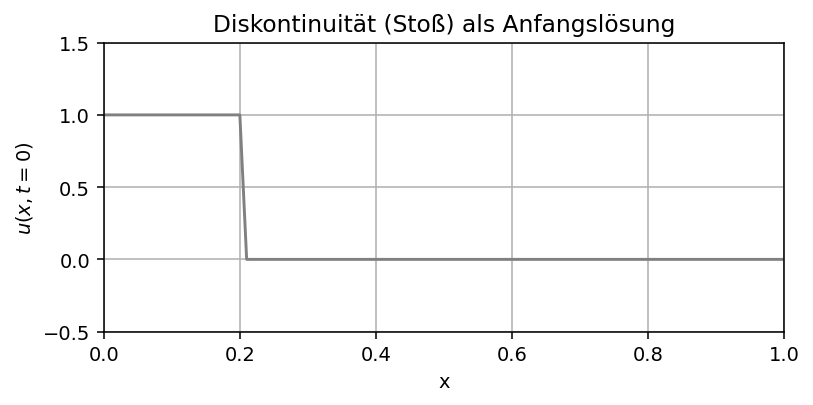

In [5]:
# Visualisierung der Anfangslösung
plt.figure(figsize=(6, 3))
plt.plot(x, initial_cond(x), color="gray")
plt.title('Diskontinuität (Stoß) als Anfangslösung')
plt.xlabel('x')
plt.ylabel(r'$u(x, t=0)$')
plt.grid(True)
plt.xlim(XLIM)
plt.ylim(YLIM1)
plt.tight_layout()
plt.show()

### **8.2.3 Löser-Schleife**

In [6]:
# Animation der Lösung
def animation_u(title, YLIM, u=u):
    fig, ax = plt.subplots(figsize=(6, 3))
    ax.set_xlim(XLIM)
    ax.set_ylim(YLIM)
    ax.set_title(f"{title}, t = 0")
    ax.plot(x, u[:, 0], lw=2, color="gray", label='Anfangslösung')
    line, = ax.plot([], [], lw=2, color="firebrick", label='Lösung')
    ax.set_xlabel('x')
    ax.set_ylabel(r'$u(x, t)$')
    ax.grid(True)
    ax.legend(loc="upper right")
    plt.tight_layout()

    def animate(j):
        line.set_data(x, u[:, j])
        ax.set_title(f"{title} (t = {t_total(u, j):.2f} s, n = {j})")
        return line,

    ani = animation.FuncAnimation(fig, animate, frames=n, interval=50, blit=True)
    plt.close(fig)
    return ani

In [7]:
# Löser-Schleife
u = simple_solver(u, dx, n, m)

ani = animation_u("Lösung der Burgersgleichung", YLIM=YLIM1)
HTML(ani.to_jshtml())

## **Aufgabe 2 b) Berechnungsvorschrift für zulässige Zeitschrittweite**

Als Angangslösung dient nun eine sinus-Funktion.

Simulieren Sie das Verhalten der sinus-Funktion bis zum Erreichen eines stationären Endzustandes für verschiedene räumliche Auflösungen (m = 25, 50, 100, 200). Vergleichen Sie die stationären Lösungen, sowie die Zahl der benötigten Iterationen.

In [8]:
# Anfansgebdinung überschreiben
def initial_cond(x):
    """ Erzeugt eine Testfunktion in Sinus-Form """
    return np.sin(np.pi * (x + 0.5)) 


# Randbedingungen überschreiben
def apply_BC(u, j):
    """ Setzt die Randbedinungen """
    u[0, j] = 1
    u[-1, j] = -1

    c0 = prop_speed(u, 1, j-1)
    if c0 < 0:
        u[0, j] = u[1, j-1]
    
    c1 = prop_speed(u, m-1, j-1)
    if c1 > 0:
        u[-1, j] = u[-2, j - 1]

    return u

# 🟠

In [9]:
# Anzahl der Stützstellen variieren
m = 25

In [10]:
n = m                           # Anzahl Zeitschritte setzen
dx = 1 / m                      # Raumschrittweite
x = np.linspace(0, 1, m + 1)    # Gitterpunkte 
u = np.zeros((m + 1, n + 1))    # Lösungsmatrix
u[:, 0] = initial_cond(x)       # Anfangsbedingung

u = simple_solver(u, dx, n, m)  # Löser-Schleife

ani = animation_u(f"m = {m}", YLIM=YLIM2, u=u)
display(HTML(ani.to_jshtml()))

## **Aufgabe 2 c) Maximal stabile CFL-Zahl**

Als Zeitschema wird nun ein dreistufiges Runke-Kutta-Schema verwendet.

Ermitteln Sie für das neue Zeitschritt-Schema die maximale, stabile CFL-Zahl. Führen Sie damit die Aufgaben aus Teil (b) erneut durch und vergleichen Sie die Ergebnisse mit (b). Welchen Einfluss hat das verbesserte Zeitschritt-Schema?

In [18]:
def prop_speed_RK(u, i):
    """ Berechnet die analytische Stoßgeschwindigkeit für Runge-Kutta-Verfahren"""
    return 0.5 * (u[i-1, 0] + u[i+1, 0])


def apply_BC_RK(u):
    """ Setzt die Randbedinungen für Runge-Kutta-Verfahren"""
    u[0] = 1
    u[-1] = -1
    return u


def d2_RK(u, i): 
    """ 2. Differenzen für Runge-Kutta-Verfahren"""
    return (abs(0.5 * (u[i+1, 0] + u[i, 0])) * (u[i+1, 0] - u[i, 0]) - abs(0.5 * (u[i-1, 0] + u[i, 0])) * (u[i, 0] - u[i-1, 0])) / dx


def three_stage_RK_central_diff(u, a1, a2, dx, n, m, k2):
    """ 
    Zeitlich:   Dreistufiges Runge-Kutta Verfahren (1. Ordnung)
    Räumlich:   Zentrales Schema mit zweiten Differenzen (1. Ordnung)
    """
    for j in range(1, n+1):
        # Stufe 1
        u = apply_BC(u, j)
        dt = get_dt(u, j)   # in get_dt wird cfl verwendet
        for i in range(1, m):
            c = prop_speed(u, i, j-1)
            a1[i, 0] = u[i, j-1] - 0.15 * dt * (c * (u[i+1, j-1] - u[i-1, j-1]) / 2 / dx - k2 * d2(u, i, j-1))

        # Stufe 2
        a1 = apply_BC_RK(a1)
        for i in range(1, m):
            c = prop_speed_RK(a1, i)
            a2[i, 0] = u[i, j-1] - 0.5 * dt * (c * (a1[i+1, 0] - a1[i-1, 0]) / 2 / dx - k2 * d2_RK(a1, i))
                
        # Stufe 3
        a2 = apply_BC_RK(a2)
        for i in range(1, m):
            c = prop_speed_RK(a2, i)
            u[i, j] = u[i, j-1] - 1.0 * dt * (c * (a2[i+1, 0] - a2[i-1, 0]) / 2 / dx - k2 * d2_RK(a2, i))
        
    return u

# 🟠

In [19]:
# Anzahl der Stützstellen und CFL-Zahl variieren
m = 25
cfl = 1

In [20]:
n = m                           # Anzahl Zeitschritte setzen
dx = 1 / m                      # Raumschrittweite
x = np.linspace(0, 1, m + 1)    # Gitterpunkte 
u = np.zeros((m + 1, n + 1))    # Lösungsmatrix
a1 = np.zeros((m + 1, 1))
a2 = np.zeros((m + 1, 1))
u[:, 0] = initial_cond(x)       # Anfangsbedingung

u = three_stage_RK_central_diff(u, a1, a2, dx, n, m, k2)  # Löser-Schleife

ani = animation_u(f"m = {m}", YLIM=YLIM2, u=u)
display(HTML(ani.to_jshtml()))